# Lab 04: Ames Iowa Home Prices

---
author: Trishla Nair
date: October 4, 2024
embed-resources: true
---

## Introduction

You work for an online real estate listing aggregator, perhaps similar to a well known company whose name rhymes with Pillow. You are tasked with predicting the sale value of homes given features of the home such as size, number of bathrooms, etc. Users of the website can use your predictions to evaluate actual list prices if they are buying. If they are selling, they can use your predictions when considering at what price to list their home.

## Methods

In [50]:
# imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from joblib import dump

### Data

In [29]:
# load data
ames_train = pd.read_csv(
    "https://cs307.org/lab-04/data/ames-train.csv",
)
ames_test = pd.read_csv(
    "https://cs307.org/lab-04/data/ames-test.csv",
)
ames_train

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,2832,908188140,160,RM,24.0,2522,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2006,WD,Normal,137500
1,2736,905426150,80,RL,NaN,19690,Pave,NaN,IR1,Lvl,...,738,Gd,GdPrv,NaN,0,8,2006,WD,Alloca,274970
2,2135,907200130,20,RL,97.0,11800,Pave,NaN,IR1,Bnk,...,0,NaN,NaN,NaN,0,8,2007,WD,Family,131000
3,2424,528228415,120,RM,NaN,3072,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,5,2006,WD,Normal,178740
4,1967,535457020,20,RL,80.0,8000,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,NaN,0,11,2007,WD,Normal,156500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1870,1020,527302070,20,RL,NaN,10825,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,7,2008,WD,Normal,181900
1871,237,905426200,20,RL,65.0,11479,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,144500
1872,1547,910202050,30,RM,40.0,3636,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,NaN,0,1,2008,WD,Normal,55000
1873,1855,533251110,20,RL,80.0,12000,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,3,2007,WD,Normal,255000


In [30]:
print(ames_train.isna().sum())

Order               0
PID                 0
MS SubClass         0
MS Zoning           0
Lot Frontage      310
                 ... 
Mo Sold             0
Yr Sold             0
Sale Type           0
Sale Condition      0
SalePrice           0
Length: 82, dtype: int64


 The data has 81 features and 1875 rows. Some columns have over 300 NaN values. Addtionally, some columns are dependent on other columns.

In [31]:
# summary statistics
ames_train.shape

(1875, 82)

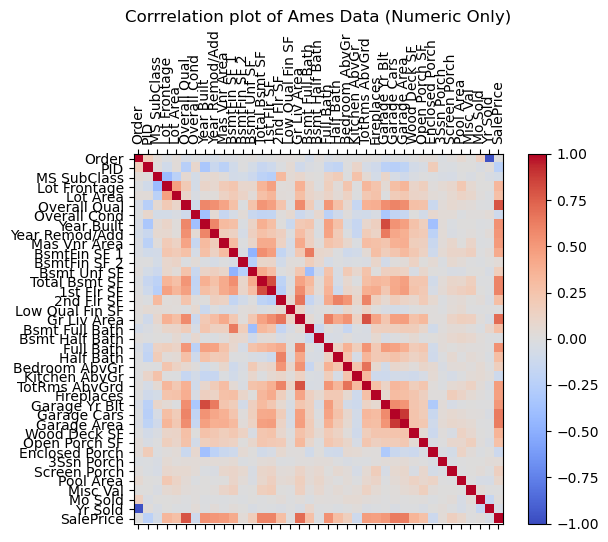

In [32]:
# visualizations
ames_numeric = ames_train.select_dtypes(include='number')
ames_numeric = ames_numeric.fillna(0)

corr = ames_numeric.corr()
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(corr,cmap='coolwarm', vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0,len(ames_numeric.columns),1)
ax.set_xticks(ticks)
plt.xticks(rotation=90)
ax.set_yticks(ticks)
ax.set_xticklabels(ames_numeric.columns)
ax.set_yticklabels(ames_numeric.columns)
ax.set_title("Corrrelation plot of Ames Data (Numeric Only)")
plt.show()

In [45]:
ames_numeric

,Order,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,...,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,SalePrice
0,2832,908188140,160,24.0,2522,7,5,2004,2004,50.0,...,0,40,0,0,0,0,0,4,2006,137500
1,2736,905426150,80,NaN,19690,6,7,1966,1966,0.0,...,586,236,0,0,0,738,0,8,2006,274970
2,2135,907200130,20,97.0,11800,5,5,1974,1974,0.0,...,0,0,0,0,0,0,0,8,2007,131000
3,2424,528228415,120,NaN,3072,7,5,2004,2004,18.0,...,144,20,0,0,0,0,0,5,2006,178740
4,1967,535457020,20,80.0,8000,5,5,1960,1960,0.0,...,0,0,0,0,0,0,0,11,2007,156500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1870,1020,527302070,20,NaN,10825,7,7,1983,1983,174.0,...,152,0,0,0,0,0,0,7,2008,181900
1871,237,905426200,20,65.0,11479,6,7,1950,1987,0.0,...,0,52,52,0,0,0,0,6,2010,144500
1872,1547,910202050,30,40.0,3636,4,4,1922,1950,0.0,...,0,0,100,0,0,0,0,1,2008,55000
1873,1855,533251110,20,80.0,12000,7,6,1980,1980,600.0,...,180,16,0,0,0,0,0,3,2007,255000


In [33]:
sns.pairplot(ames_train)

Exception ignored in: <function TransformNode.set_children.<locals>.<lambda> at 0x000001FDDA386340>
Traceback (most recent call last):
  File "c:\Users\Trish\anaconda3\envs\CS307\Lib\site-packages\matplotlib\transforms.py", line 198, in <lambda>
    self, lambda _, pop=child._parents.pop, k=id_self: pop(k))
                                                       ^^^^^^
KeyboardInterrupt: 
Exception ignored in: <function WeakKeyDictionary.__init__.<locals>.remove at 0x000001FDE42D79C0>
Traceback (most recent call last):
  File "c:\Users\Trish\anaconda3\envs\CS307\Lib\weakref.py", line 370, in remove
    self = selfref()
           ^^^^^^^^^
KeyboardInterrupt: 


KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x000001FDE44B7100> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

Using a pairplot and a heatmap, we can see which variables have higher correlations.

### Models

In [57]:
# process data for ML
ames_train = ames_train.fillna('Not Available')
ames_test.fillna('Not Available')

# create X and y for train dataset
X_train = ames_train.drop("SalePrice", axis=1)
y_train = ames_train["SalePrice"]

# create X and y for test dataset
X_test = ames_test.drop("SalePrice", axis=1)
y_test = ames_test["SalePrice"]

In [60]:
# train models
# instantiate a liner regression
lr = LinearRegression()

# fit linear regression to the train data
mod = lr.fit(X_train, y_train)
mod

In [59]:
dump(mod, "ames-housing.joblib")

['ames-housing.joblib']

To complete this, we used a linear regression model to help predict values.

## Results

In [61]:
# report model metrics

def rmse(y_true, y_pred):
    return np.sqrt(np.mean((y_true - y_pred) ** 2))

print(f"Test RMSE: {rmse(y_test, lr.predict(X_test)):.3f}")

ValueError: The feature names should match those that were passed during fit.
Feature names unseen at fit time:
- Alley
- Bldg Type
- Bsmt Cond
- Bsmt Exposure
- Bsmt Qual
- ...
Feature names seen at fit time, yet now missing:
- Alley_Grvl
- Alley_Pave
- Bldg Type_1Fam
- Bldg Type_2fmCon
- Bldg Type_Duplex
- ...


## Discussion

While I do believe linear regression is the best approach to the pronlem in question, there are still bugs in the following method.

### Conclusion

In conclusion, the best method to use is linear regression